# 잘 만든 Augmentation, 이미지 100장 안 부럽다.

### 데이터셋의 현실

#### 대량의 데이터셋

앞서 이야기 했듯, 이미지넷은 1,400만 장의 이미지를 보유하고 있으며, 우리가 자주 사용하는 CIFAR-10만 하더라도 학습용 데이터셋은 5만 장이나 된다.

이런 규모의 데이터셋을 만드는 데 많은 비용이 든다.

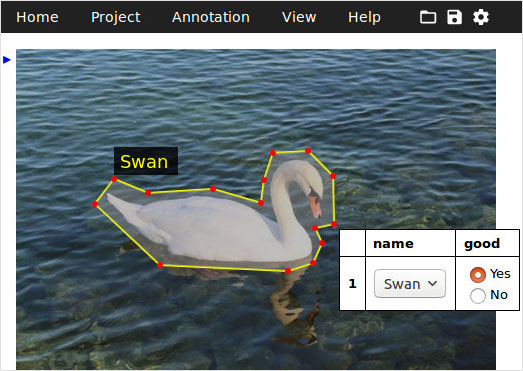

#### 직접 구축하는 데이터셋

사진을 보고 시내의 유명한 카페를 분류하는 모델을 만들어야 하는 프로젝트가 생겼다. 그러면 우리는 어떻게 데이터셋을 모을 수 있을까?

강남의 카페를 조사하기 위해서 인스타그램(Instagram)을 크롤링 해 20여 개 카페의 사진 약 2,500장을 얻을 수 있었다고 상상해 보자. 처음 크롤링 할 때는 많았으나 내부 인테리어 사진으로 카페를 구분하기 위해서 음식 사진, 사진 사람을 제외하고 나니 많은 수가 줄었다. 이처럼 직접 데이터를 수집한다면 만 장 단위로 데이터셋을 모으기가 쉽지 않다는 것을 알 수 있다.



### Data Augmentation이란? (1) 개요

그렇다면 어떻게 해야 할까? 열심히 모은 데이터셋을 최대한 활용할 수 있는 방법은 없을까?

Data augmentation은 갖고 있는 데이터셋을 여러 가지 방법으로 증강시켜(augment) 실질적인 학습 데이터셋의 규모를 키울 수 있는 방법이다. 일반적으로 하드디스크에 저장된 이미지 데이터를 메모리에 로드한 후, 학습시킬 때 변형을 가하는 방법을 사용한다. 이를 통해 1장의 이미지를 더 다양하게 쓸 수 있게 된다.

데이터가 많아진다는 것은 과적합(overfitting)을 줄일 수 있다는 것을 의미한다. 또한 우리가 가지고 있는 데이터셋이 실제 상황에서의 입력값과 다를 경우, augmentation을 통해서 실제 입력값과 비슷한 데이터 분포를 만들어 낼 수 있다. 예를 들어, 우리가 학습한 데이터는 노이즈가 많이 없는 사진이지만 테스트 이미지는 다양한 노이즈가 있는 경우 테스트에서 좋은 성능을 내기 위해서는 이러한 노이즈의 분포를 예측하고 학습 데이터에 노이즈를 삽입해 모델이 이런 노이즈에 잘 대응할 수 있도록 해야 한다. 이렇게 data augmentation은 데이터를 늘릴 뿐만 아니라 모델이 실제 테스트 환경에서 잘 동작할 수 있도록 도와줘야 한다.

#### 이미지 데이터 augmentation

이미지 데이터의 augmentation은 포토샵, SNS의 사진 필터, 각종 카메라 앱에서 흔히 발견할 수 있는 기능들과 비슷하다. 쉬운 예로는 모델이 다양한 색상의 사진을 학습하게 하기 위해서 우리가 인스타그램에 업로드할 때 쓰는 색상 필터들을 적용해 볼 수 있다. 또 좌우 대칭이나 상하 반전과 같이 이미지의 공간적 배치를 조작할 수도 있다.

### Data Augmentation이란? (2) 다양한 Image Augmentation 방법

그렇다면 image augmentation 기법에는 구체적으로 어떤 것들이 있는지 살펴보자. 먼저 텐서플로우 튜토리얼에 소개된 image augmentation 예제들로부터 시작하겠다. 아래 텐서플로우 페이지에서는 텐서플로우 API를 사용해 바로 적용할 수 있는 image augmentation 기법들을 소개하고 있다.

https://www.tensorflow.org/tutorials/images/data_augmentation

#### Flipping

Flip은 이미지를 대칭하는 기능이다. 우리가 거울을 보면 반전이 되듯이 좌우 또는 상하로 이미지를 반전시키는 방법이다. 분류 문제에서는 문제가 없을 수 있지만 물체 탐지(detection), 세그멘테이션(segmentation) 문제 등 정확한 정답 영역이 존재하는 문제에 적용할 때에는 라벨도 같이 좌우 반전을 해주어야 한다.

만약 숫자나 알파벳 문자릴 인식(recognition)하는 문제에 적용할 때도 주의해야 한다. 상하나 좌우가 반전될 경우 다른 글자가 될 가능성이 있기 때문이다.

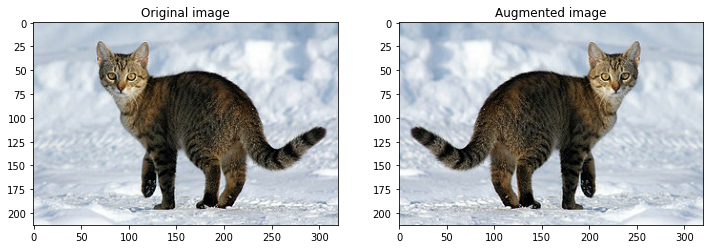

#### Gray scale

Gray scale은 3가지 채널(channel)을 가진 RGB 이미지를 하나의 채널을 가지도록 해준다. 아래의 시각화 예제는 흑백 대신 다른 색상으로 이미지를 표현했다. 텐서플로우에서 어떻게 구현이 되었는지는 아래 코드를 확인하자. RGB 각각의 채널마다 가중치(weight)를 주어 가중합(weighted sum)을 하였다. 사용된 가중치의 경우 합이 1이 됨을 알 수 있다.

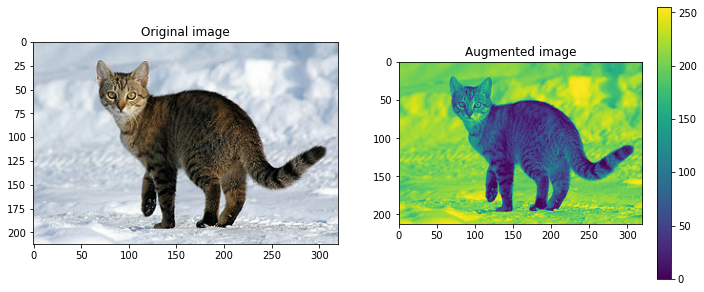

#### Saturation

Saturation은 RGB 이미지를 HSV(Hue(색조), Saturation(채도), Value(명도)의 3가지 성분으로 색을 표현) 이미지로 변경하고 S(saturation) 채널에 오프셋(offset)을 적용, 조금 더 이미지를 선명하게 만들어 준다. 이후 다시 우리가 사용하는 RGB 색상 모델로 변경을 해준다.

      색상 모델(gray, RGB, HSV, YCVCr)에 대해서 보통 이미지, 영상 관련 처리를 할 때 상황에 맞는 색상 모델을 정해야 한다. 
      색상 모델에는 여러 가지 종류가 있다. 간단하게 색상 모델에 대한 특징을 정리해보겠다.

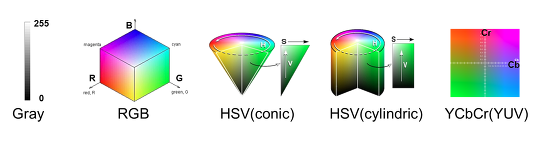

Gray 모델 - 색(Color) 정보를 사용하지 않고, 밝기 정보만으로 영상을 표현하는 것입니다.검정 (0) 부터 흰색 (255) 까지 총 256 단계의 밝기 값(Intensity)으로 영상 픽셀 값을 표현합니다.

RGB 모델 - 가장 기본적인 색상 모델로, 색(Color)을 Red, Green, Blue의 3가지 성분의 조합으로 생각하는 것을 말합니다. RGB 모델에서 검은색은 R = G = B = 0, 흰색은 R = G = B = 255, 빨간색은 R = 255, G = B = 0, 노란색은 R = G = 255, B = 0으로 표현합니다. R = G = B 인 경우는 무채색인 Gray 색상이 됩니다. R, G, B 각각은 0 ~ 255 사이의 값을 가질 수 있으므로, RGB 색상 모델을 사용하면 총 256 * 256 * 256 = 16,777,216 가지의 색을 표현할 수 있습니다. ex)(0, 0, 0) : 검정,(255, 255, 255) : 흰색,(255, 0, 0) : 빨강,(0, 255, 0) : 초록,(0, 0, 255) : 파랑

HSV 모델 - Hue(색조), Saturation(채도), Value(명도)의 3가지 성분으로 색을 표현합니다. Hue는 색조 ( 예 : 붉은색 계열인지 푸른색 계열인 지) 를 나타내고, Saturation은 그 색이 얼마나 선명한(순수한) 색인지, Value 는 밝기(Intensity)를 나타냅니다. HSV 모델은 우리가 색을 가장 직관적으로 표현할 수 있는 모델이고, 머리속에서 상상하는 색을 가장 쉽게 만들어낼 수 있는 모델입니다. 영상처리 / 이미지 처리 에서 HSV 모델을 사용할 때, H, S, V 각각은 0 ~ 255 사이의 값으로 표현됩니다. H 값은 색의 종류를 나타내기에 크기는 의미가 없으며 단순한 인덱스(Index)를 나타냅니다. S 값은 0이면 무채색 (gray 색), 255면 가장 선명한(순수한) 색임을 나타냅니다. V 값은 작을수록 어둡고, 클수록 밝은 색임을 나타냅니다. HSV 색상 모델은 그림과 같이 원뿔(conic) 형태, 원기둥(cylindric) 형태가 있습니다.

YCbCr 모델 - RGB 색에서 밝기 성분(Y)과 색차 정보(Cb, Cr)를 분리하여 표현하는 색상 모델입니다.디지털 영상에서 Y, Cb, Cr 은 각각 0 ~ 255 사이의 값을 가지며, Y가 커지면 그림이 전체적으로 밝아지고, Y가 작아지면 전체적으로 어두워집니다.YCbCr 모델은 mpeg에서 사용되는 색상모델로써, 인간의 눈이 밝기 차에는 민감하지만, 색차에는 상대적으로 둔감하다는 점을 이용해서 Y에서 많은 비트 수(해상도)를 할당하고 Cb, Cr에는 낮은 비트 수를 할당하는 방식으로 비디오를 압축합니다. 따라서 비디오 데이터를 처리할 경우에 YCbCr 모델을 사용하면 별도의 색상 변환을 하지 않아도 되는 장점을 가지고 있습니다.또한, YCbCr 모델은 YUV 모델로도 불립니다.

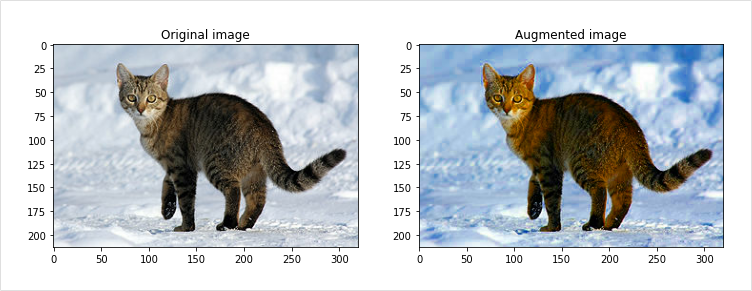

#### Brightness

밝기를 조절할 수도 있다. 우리가 주로 사용하는 RGB에서 (255,255,255)는 흰색을, (0,0,0)은 검은색을 의미한다.

따라서 이미지는 RGB 채널에서 값을 더해주면 밝아지고, 빼주면 어두워진다. 이를 통해서 Brightness를 변경할 수 있다.

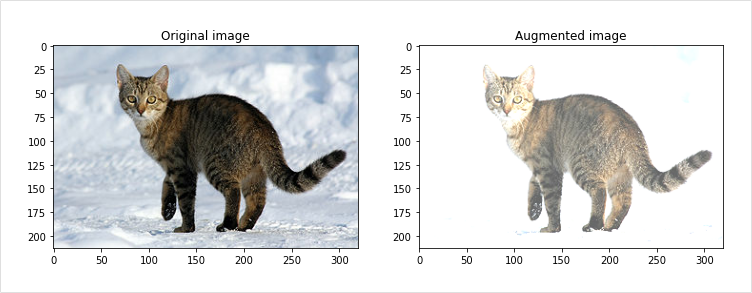

#### Rotation

Rotation은 이미지 각도를 변환해 준다. 90도의 경우 직사각형 형태가 유지되기 때문에 이미지의 크기만 조절해 주면 바로 사용할 수 있다. 하지만, 90도 단위로 돌리지 않는 경우 직사각형 형태에서 기존 이미지로 채우지 못하는 영역을 어떻게 처리해야 할지 유의해야 한다.

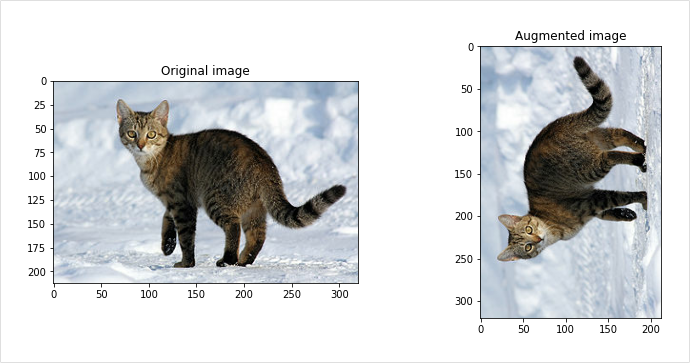

#### Center Crop

Center crop은 이미지의 중앙을 기준으로 확대하는 방법이다. 너무 작게 center crop을 할 경우 본래 가진 라벨과 맞지 않게 되는 상황이 발생할 수 있으니 주의가 필요하다. 예를 들어 고양이 라벨의 이미지를 확대해 한 장 더 만들어내려면, 이미지 내에 고양이의 형상을 유지해야 하고 털만 보이는 이미지를 만들어서는 안 된다.

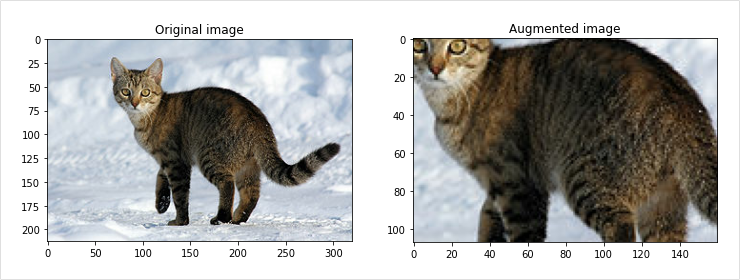

#### 정리


위에 기본적인 방법들 외에도 다양한 augmentation 방법론이 있다. 이들 방법을 사용하면 아래 이미지처럼 라벨은 유지한채 다양한 이미지를 학습 데이터로 사용할 수 있게 된다.

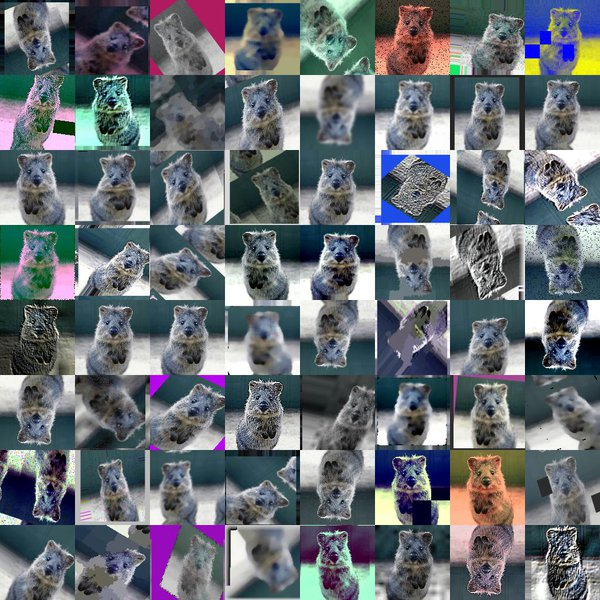

### 텐서플로우를 사용한 Image Augmentation (1) Flip

#### 준비하기

이제 위에서 봤던 방법들을 코드로 사용해 보겠다. 필요에 따라서 매개변수에 전달하는 값을 바꿔보고 데이터에 랜덤하게 적용해 보도록 하겠다. 이미지를 PIL로 로드하고 이를 텐서로 바꾼 뒤, 기법을 하나씩 적용해보고 이를 다시 이미지로 화면에 표시해서 결과를 확인하겠다.



In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import os

sample_img_path = '/content/drive/MyDrive/data_augmentation/images/mycat.jpg'
sample_img_path

'/content/drive/MyDrive/data_augmentation/images/mycat.jpg'

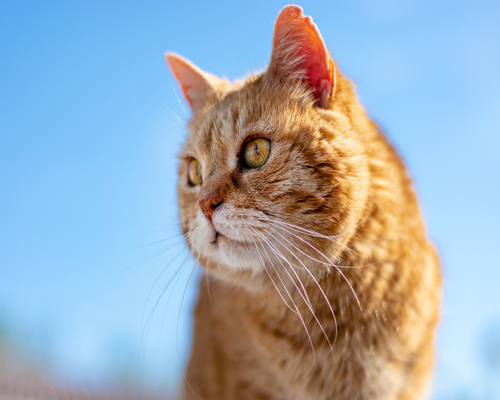

In [3]:
image = Image.open(sample_img_path).resize((500, 400)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_tensor = tf.keras.preprocessing.image.img_to_array(image)

image

#### Flip 해보기

Flip을 적용해준다. Flip은 flip_left_right와 flip_up_down 두가지로 좌우와 상하 반전으로 구분된다.

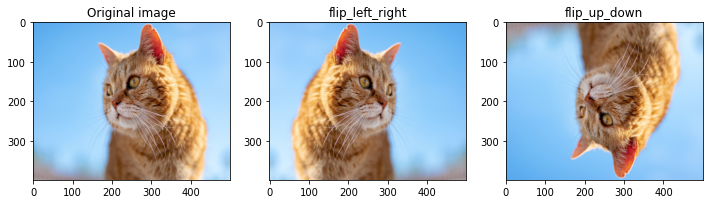

In [4]:
flip_lr_tensor = tf.image.flip_left_right(image_tensor)
flip_ud_tensor = tf.image.flip_up_down(image_tensor)
flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)

plt.figure(figsize=(12, 12))

plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(image)

plt.subplot(1,3,2)
plt.title('flip_left_right')
plt.imshow(flip_lr_image)

plt.subplot(1,3,3)
plt.title('flip_up_down')
plt.imshow(flip_ud_image)

plt.show()

위의 함수들은 일괄적으로 상하 또는 좌우 반전을 적용한다. 우리는 이를 확률에 따라서 적용되도록 해야 한다. 그래야 반전이 되지 않은 원본 데이터도 활용이 될 수 있기 때문이다. 이를 위해서 활용할 수 있는 것이 random_flip_left_right와 random_flip_up_down이다. 필요에 따라서는 직접 이 둘을 합쳐서 random_flip으로 상하좌우 반전을 적용하는 함수를 직접 만들어 볼 수도 있다. 아래 코도를 반복해서 돌려보면서 random augmentation이 어떻게 작동하는지 직접 확인해 보자.

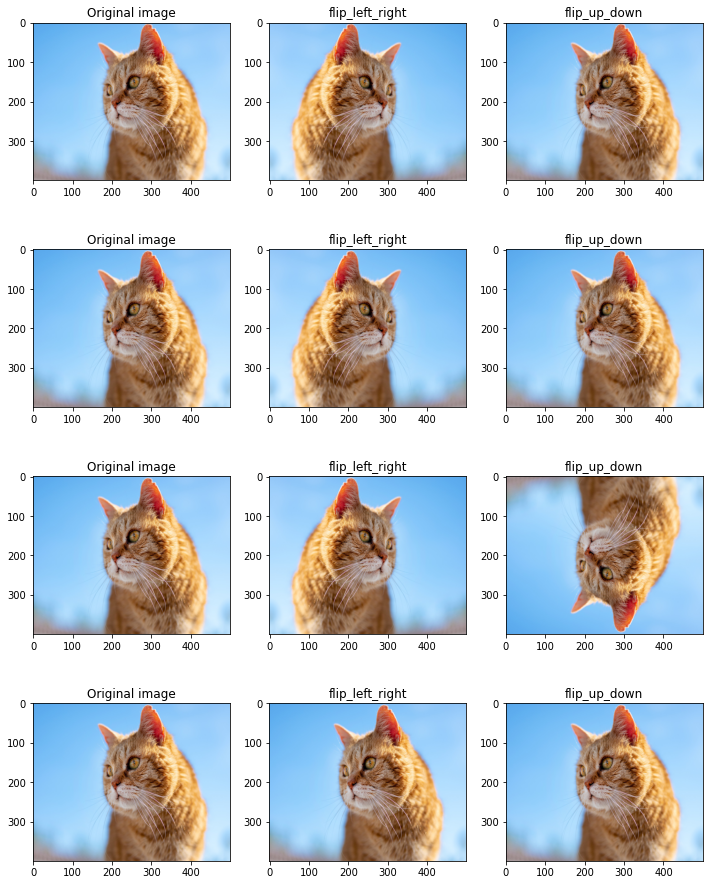

In [5]:
plt.figure(figsize=(12, 16))

row = 4
for i in range(row):
    flip_lr_tensor = tf.image.random_flip_left_right(image_tensor)
    flip_ud_tensor = tf.image.random_flip_up_down(image_tensor)
    flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
    flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)
    
    plt.subplot(4,3,i*3+1)
    plt.title('Original image')
    plt.imshow(image)

    plt.subplot(4,3,i*3+2)
    plt.title('flip_left_right')
    plt.imshow(flip_lr_image)

    plt.subplot(4,3,i*3+3)
    plt.title('flip_up_down')
    plt.imshow(flip_ud_image)

### 텐서플로우를 사용한 Image Augmentation (2) Center Crop

Center crop은 이전에 설명드렸던 것과 같이 중앙을 기준으로 자른 이미지를 사용하는 augmentation 기법이다.

단순하게 중심점을 기준으로 사진을 확대하는 것으로 생각하기 쉽지만, 적용할 때 주의해 사용해야 한다. central_fraction은 얼마나 확대를 할지를 조절하는 매개변수이다. 1.0인 경우는 원본 이미지와 같다. 그러나 예를 들어 고양이 이미지를 확대하면 0.5까지는 보일 수 있지만, 0.25 수준으로 내려가면 털만 보이고 고양이의 형샹을 찾기 어려울 수 있다. 따라서 central_fraction의 범위를 문제가 생기지 않는 범위에서 랜덤하게 조절되도록 해야 한다.

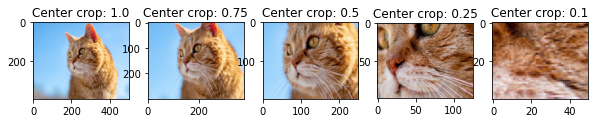

In [6]:
plt.figure(figsize=(12, 15))

central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1]
col = len(central_fractions)
for i, frac in enumerate(central_fractions):
    cropped_tensor = tf.image.central_crop(image_tensor, frac)
    cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)
    
    plt.subplot(1,col+1,i+1)
    plt.title(f'Center crop: {frac}')
    plt.imshow(cropped_img)

랜덤하게 centeral_crop을 적용하는 함수는 텐서플로우에서 기본적으로 제공되지 않는다. 그렇다면 어떻게 만들 수 있을까? 파이썬의 random 모듈을 사용해도 되고 텐서플로우의 랜덤 모듈을 사용해도 된다.

아래는 tf.random.uniform을 사용해서 central_fraction 매개변수에 전달할 값을 만들고 이를 사용해 cropped_tensor를 만들어내는 random_central_crop() 함수이다.

In [7]:
def random_central_crop(image_tensor, range=(0, 1)):
    # range 범위에서 무작위로 잘라낼 비율을 선택합니다
    central_fraction = tf.random.uniform([1], minval=range[0], maxval=range[1], dtype=tf.float32)
    cropped_tensor = tf.image.central_crop(image_tensor, central_fraction)
    return cropped_tensor
print('=3')

=3


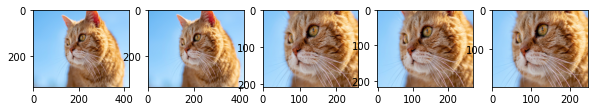

In [8]:
plt.figure(figsize=(12, 15))

col = 5
for i in range(col):
    cropped_tensor = random_central_crop(image_tensor)
    cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)
    
    plt.subplot(1,col+1,i+1)
    plt.imshow(cropped_img)

### 텐서플로우를 사용한 Image Augmentation (3) 직접 해보기

이제 직접 augmentation을 활용해 보는 시간을 가져보자. 직접 사용할 함수는 tf.image.random_crop()와 tf.image.random_brightness()이다.

#### tf.image.random_crop()

https://www.tensorflow.org/api_docs/python/tf/image/random_crop

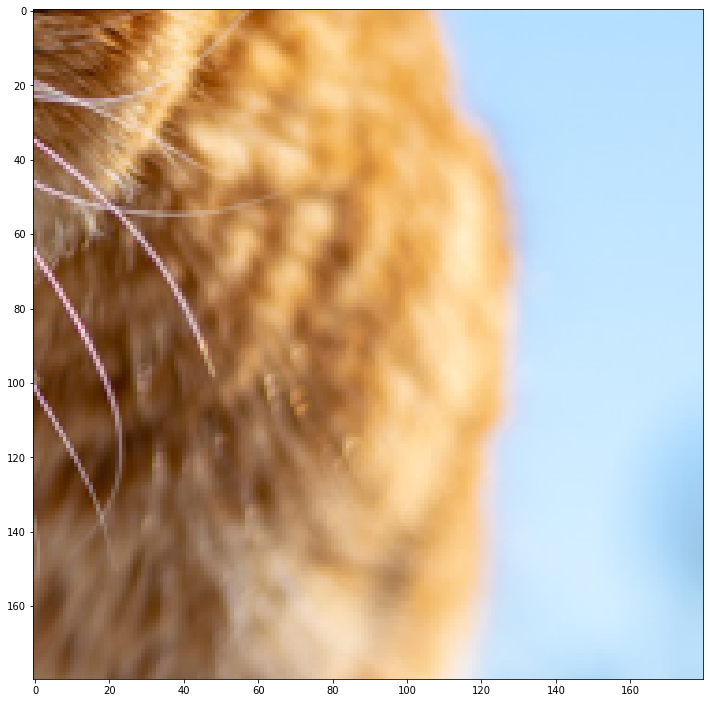

In [9]:
plt.figure(figsize=(12, 15))

random_crop_tensor = tf.image.random_crop(image_tensor,[180,180,3])
random_crop_image = tf.keras.preprocessing.image.array_to_img(random_crop_tensor)

plt.imshow(random_crop_image)
plt.show()

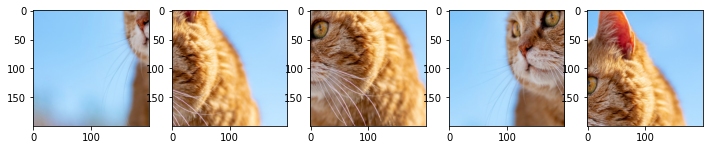

In [10]:
# display 5 random cropped images
plt.figure(figsize=(12, 15))

for i in range(5):
  random_crop_tensor = tf.image.random_crop(image_tensor,[200,200,3])
  random_crop_image = tf.keras.preprocessing.image.array_to_img(random_crop_tensor)
  plt.subplot(1,5,i+1)
  plt.imshow(random_crop_image)

#### tf.image.random_brightness()

두번째로 적용할 함수는 tf.image.random_brightness()이다. 

https://www.tensorflow.org/api_docs/python/tf/image/random_brightness

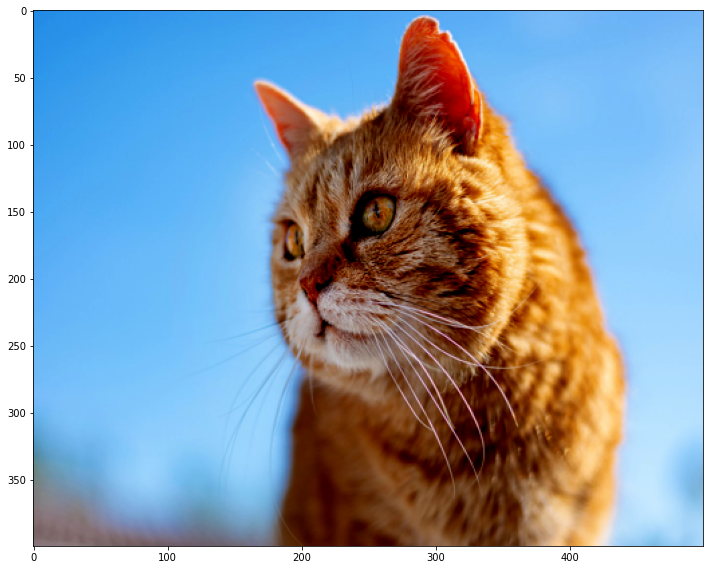

In [11]:
# apply random_brightness on cat image
plt.figure(figsize=(12, 15))

random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)
random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

plt.imshow(random_bright_image)
plt.show()

      tf.image.random_brightness()만 적용할 경우 이미지 텐서 값의 범위가 0~255를 초과하게 될 수도 있다. 이 경우 plt.imshow()에서 rescale되어 밝기 변경 효과가 상쇄되어 보일 수도 있다.
      따라서 tf.image.random_brightness() 다음에는 tf.clip_by_value()를 적용해 주는 것을 잊지말자.

적절한 샘플을 5장 만들어서 직접 화면에 띄어 보자.

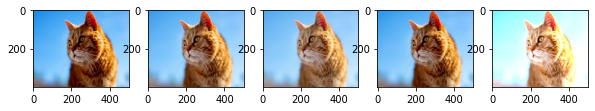

In [12]:
# display 5 random brightness images
plt.figure(figsize=(12, 15))

col = 5
for i in range(5):
    random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)
    random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
    random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

    plt.subplot(1,col+1,i+1)
    plt.imshow(random_bright_image)

### albumentations 라이브러리

#### albumentations 라이브러리 사용하기

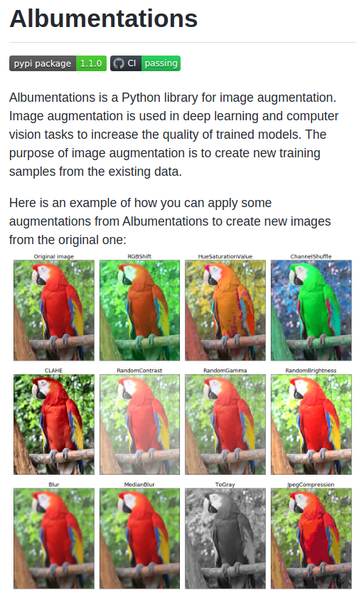

https://github.com/albumentations-team/albumentations

지금까지 텐서플로우에서 기본적으로 제공되는 augmentation 함수들을 확인해 봤다. 이러한 augmentation만을 모아서 제공하는 전문 라이브러리들이 있다. 이번에는 그중 albumentations 라이브러리를 활용하겠다. albumentations은 이미지 증강을 위한 Python 라이브러이다. 이미지 증강은 딥러닝 및 컴퓨터 비전 작업에서 훈련된 모델의 품질을 높이는 데 사용된다.

또한 아래 사진처럼 다양한 작업에서 사용되고 있다.

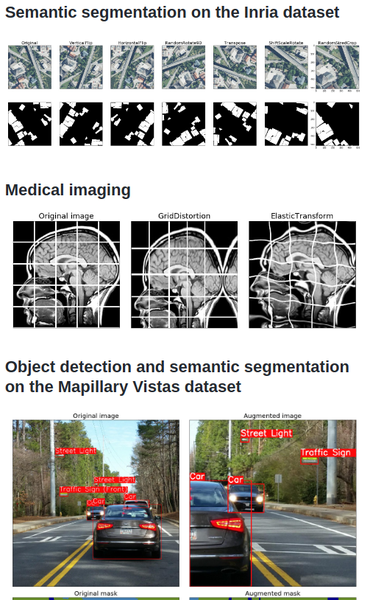

augmentation에서는 배열을 이미지의 기본 형태로 사용한다. 따라서 PIL Image 데이터형을 넘파이(numpy) 배열로 변환하여 사용하도록 한다.

In [13]:
import numpy as np
image = Image.open(sample_img_path).resize((400, 300)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_arr = np.array(image)
image_arr.shape

(300, 400, 3)

편하게 이미지를 볼 수 있는 visualize 함수를 만들어 놓겠다.

In [14]:
def visualize(image):
    plt.figure(figsize=(20, 10))
    plt.imshow(image)

print("슝")

슝


#### augmentation 기법 사용해 보기

transforms.Affine()

이제 위에서 확인해보지 않았던 augmentation 중 하나를 해보자. transforms.Affine()은 아핀 변환(Affine transform)을 이미지에 적용한다. 2D 변환의 일종인 아핀 변환은 이미지의 스케일(scale)을 조절하거나 평행이동, 또는 회전 등의 변환을 줄 수 있다.

https://albumentations.ai/docs/api_reference/augmentations/geometric/transforms/#albumentations.augmentations.geometric.transforms.Affine

아래 코드를 실행하면 -45도와 45도 사이에 랜덤하게 각도를 변환하는 augmentation을 10장 볼 수 있다.

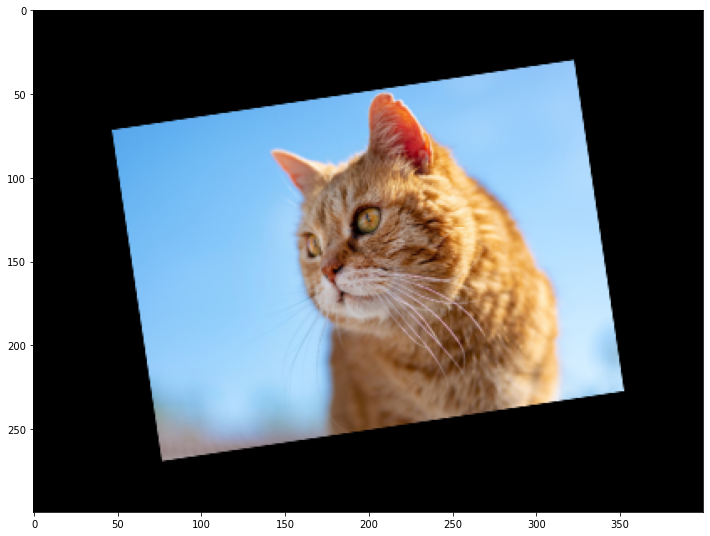

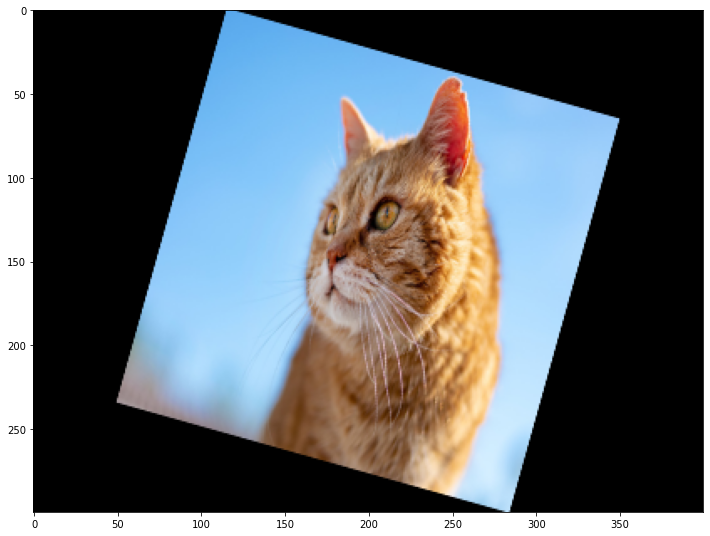

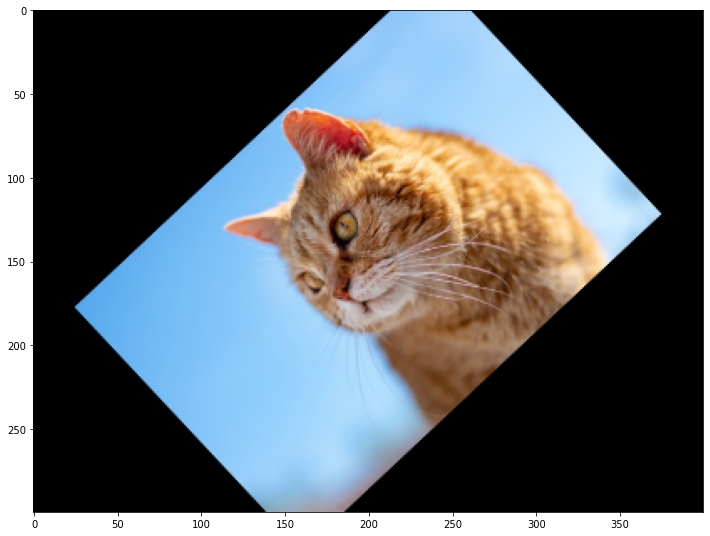

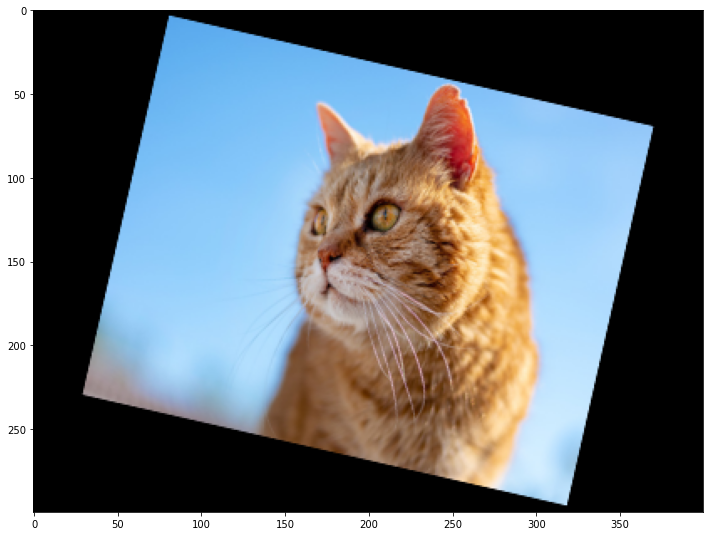

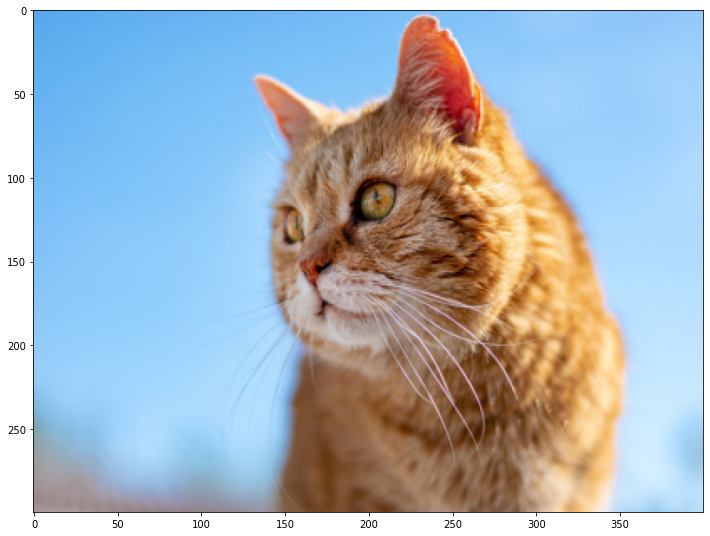

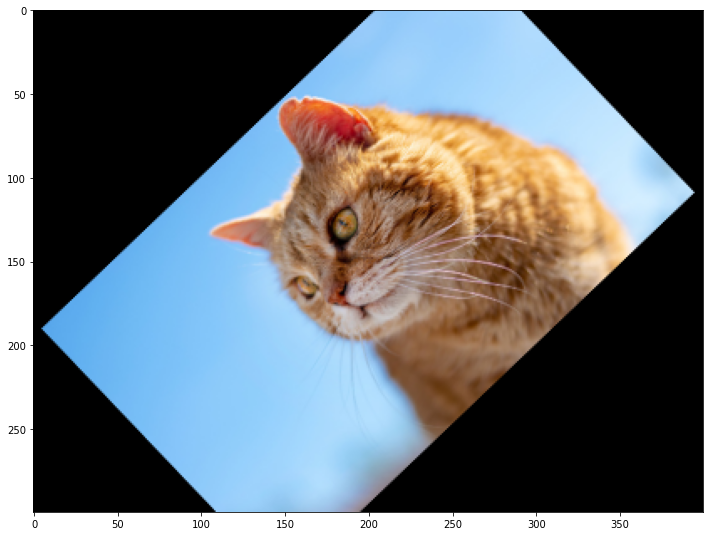

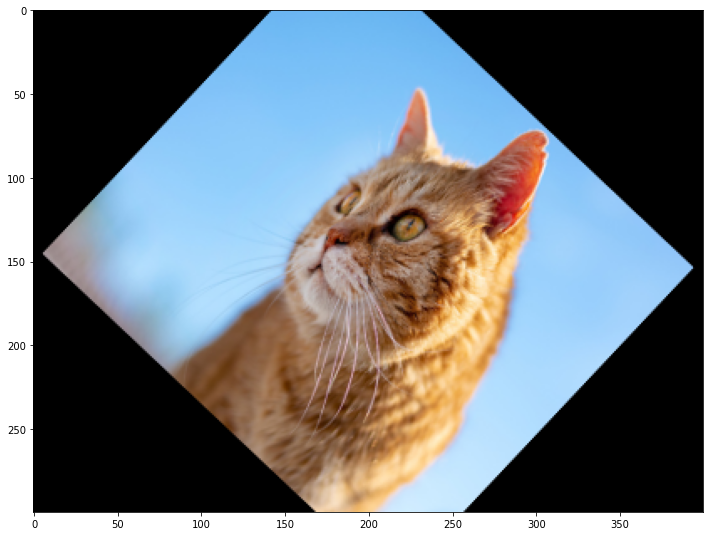

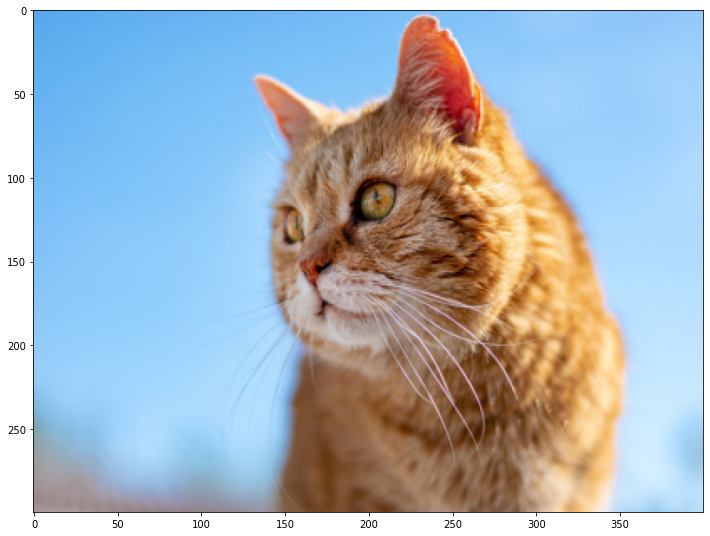

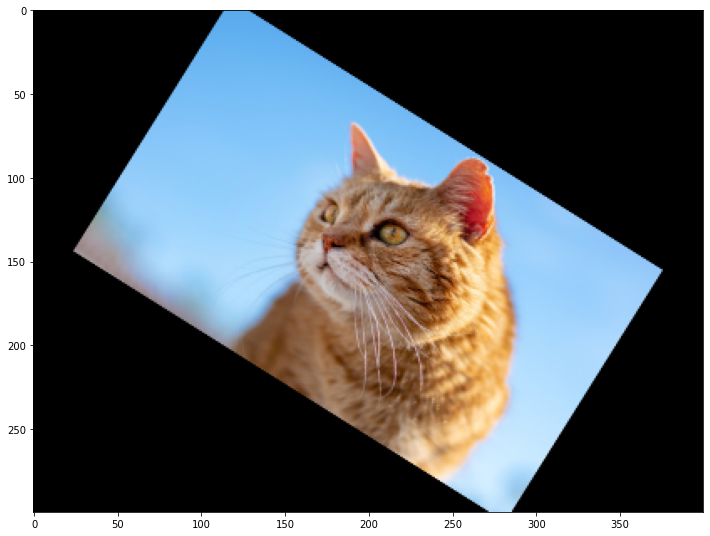

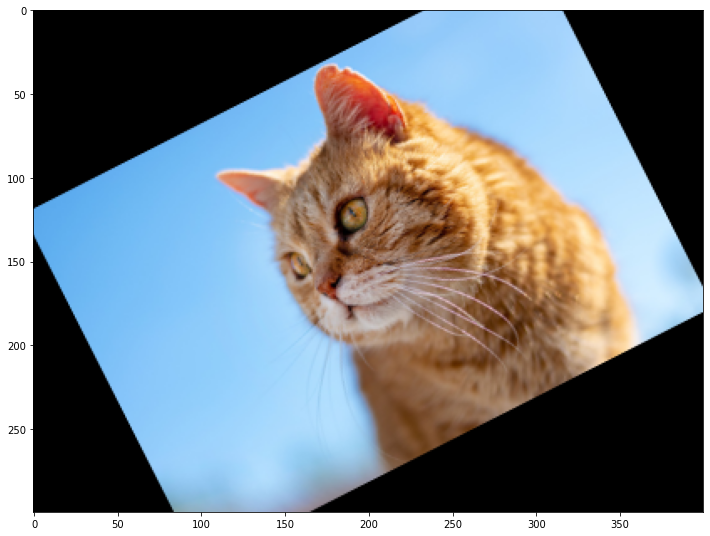

In [15]:
import albumentations as A

for i in range(10):
    transform = A.Compose([
        A.Affine(rotate=(-45, 45),scale=(0.5,0.9),p=0.5) 
    ])
    transformed = transform(image=image_arr)
    plt.figure(figsize=(12,12))
    plt.imshow((transformed['image']))
    plt.show()

transforms.RandomCrop()



이번에는 RandomCrop()을 사용해서 256x256 정도의 부분을 랜덤하게 짤 10개 정도 생성해 보겠다.

https://albumentations.ai/docs/api_reference/augmentations/crops/transforms/#albumentations.augmentations.crops.transforms.RandomCrop

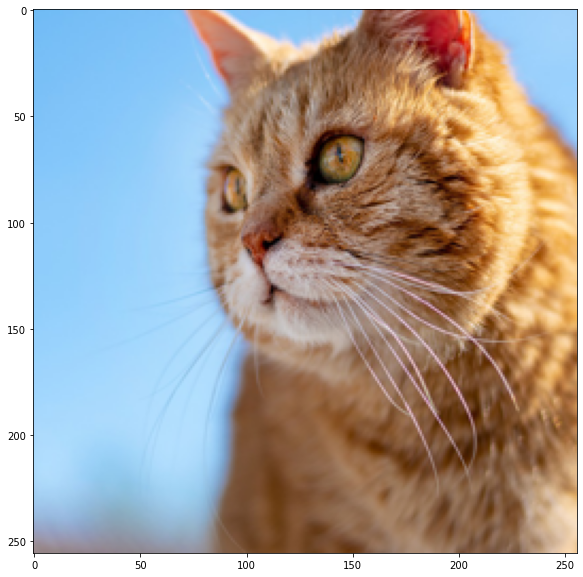

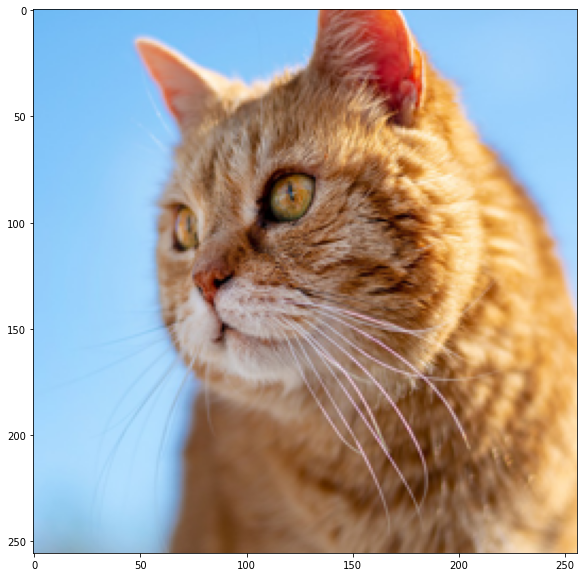

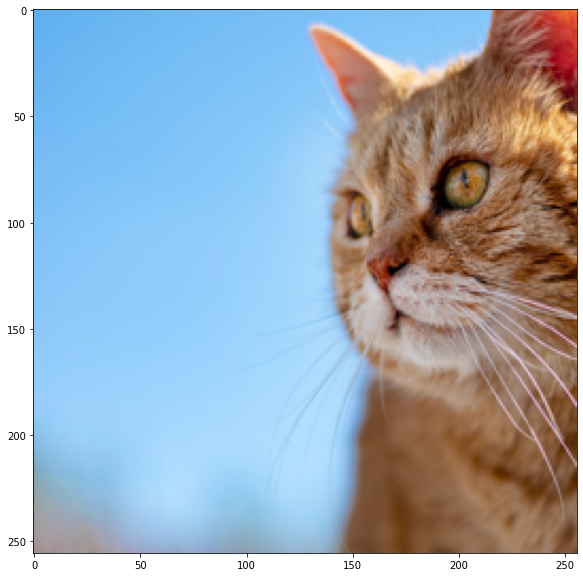

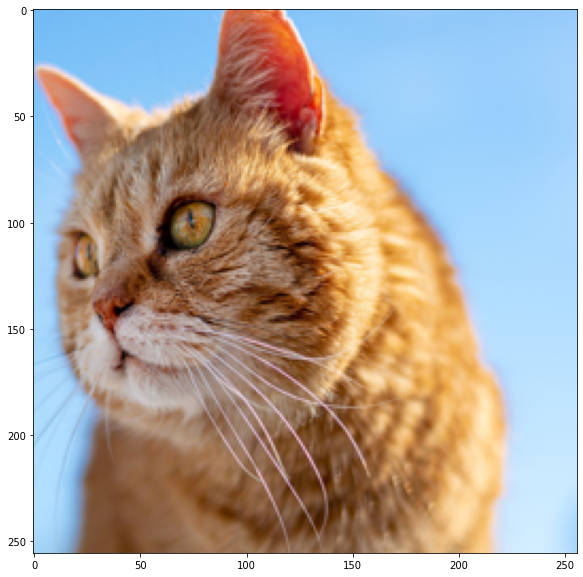

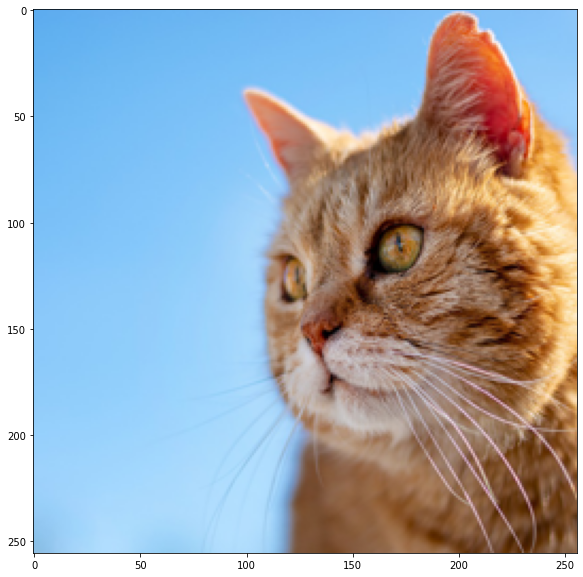

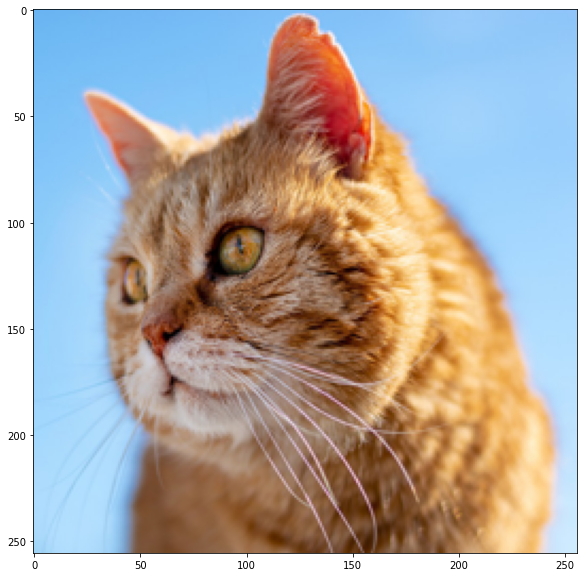

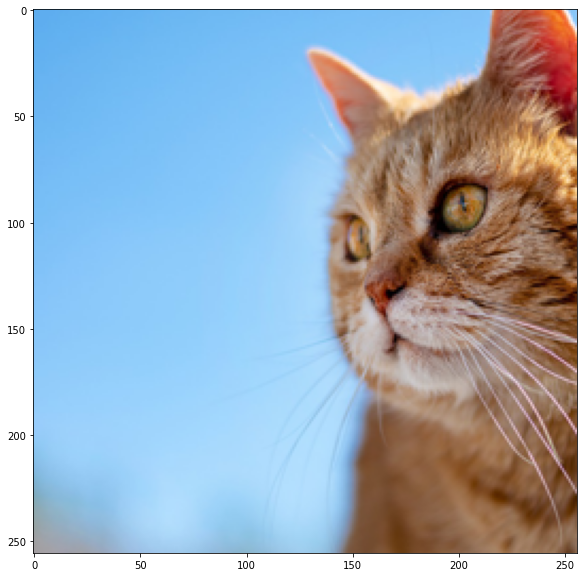

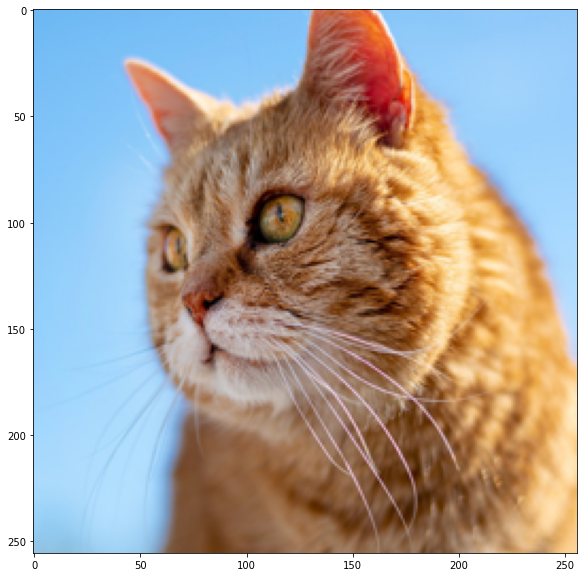

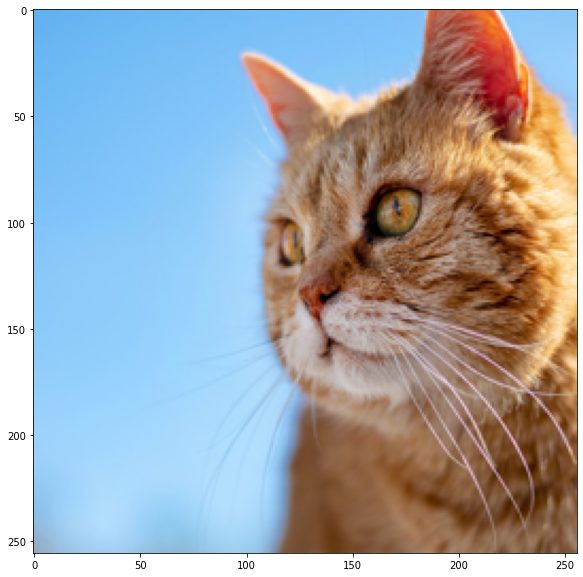

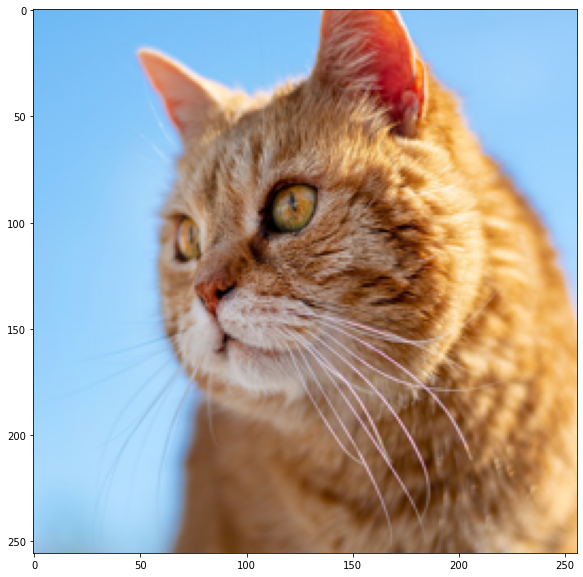

In [16]:
for i in range(10):
    transform = A.Compose(
        [A.RandomCrop(width=256, height=256)]
    )
    transformed = transform(image=image_arr)
    visualize(transformed['image'])

MedianBlur()

MedianBlur()를 활용하여 블러처리를 쉽게 할 수 있다.

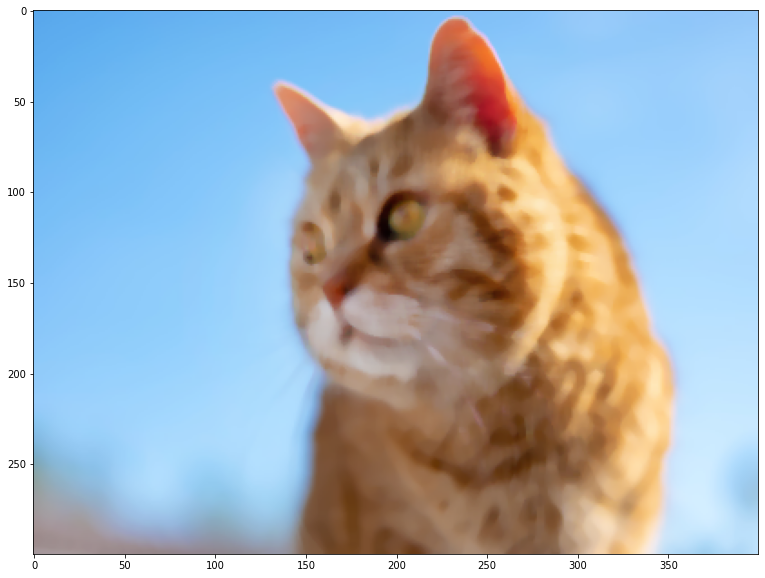

In [17]:
transform = A.Compose(
    [A.MedianBlur(blur_limit=7, always_apply=False, p=0.5)]
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

ToGray().MultiplicativeNoisse()

이렇게 하나씩 기법을 적용하다 보면 'augmentation 기법들을 한 번에 조합하여 사용할 수는 없을끼?'라는 생각이 든다. 아래 코드 처럼 여러 가지의 augmentation 기법을 순차적으로 적용할 수 있다. 아래 코드에서는 위에서 사용한 ToGray()와 MultiplicativeNoise)이 적용된 결과를 볼 수 있다.

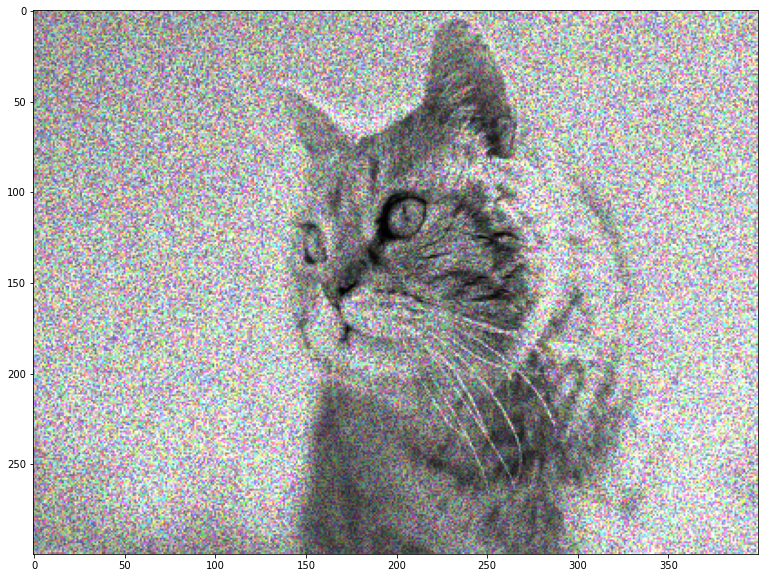

In [18]:
transform = A.Compose(
    [A.ToGray(p=1),
    A.MultiplicativeNoise(multiplier=[0.5, 1.5], elementwise=True, per_channel=True, p=1)]
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

지금까지 사용해본 내용을 토대로 그레이 색상의 노이즈가 있는 RandomCrop()을 사용하여 고양이 이미지 100장을 시각화해보자.

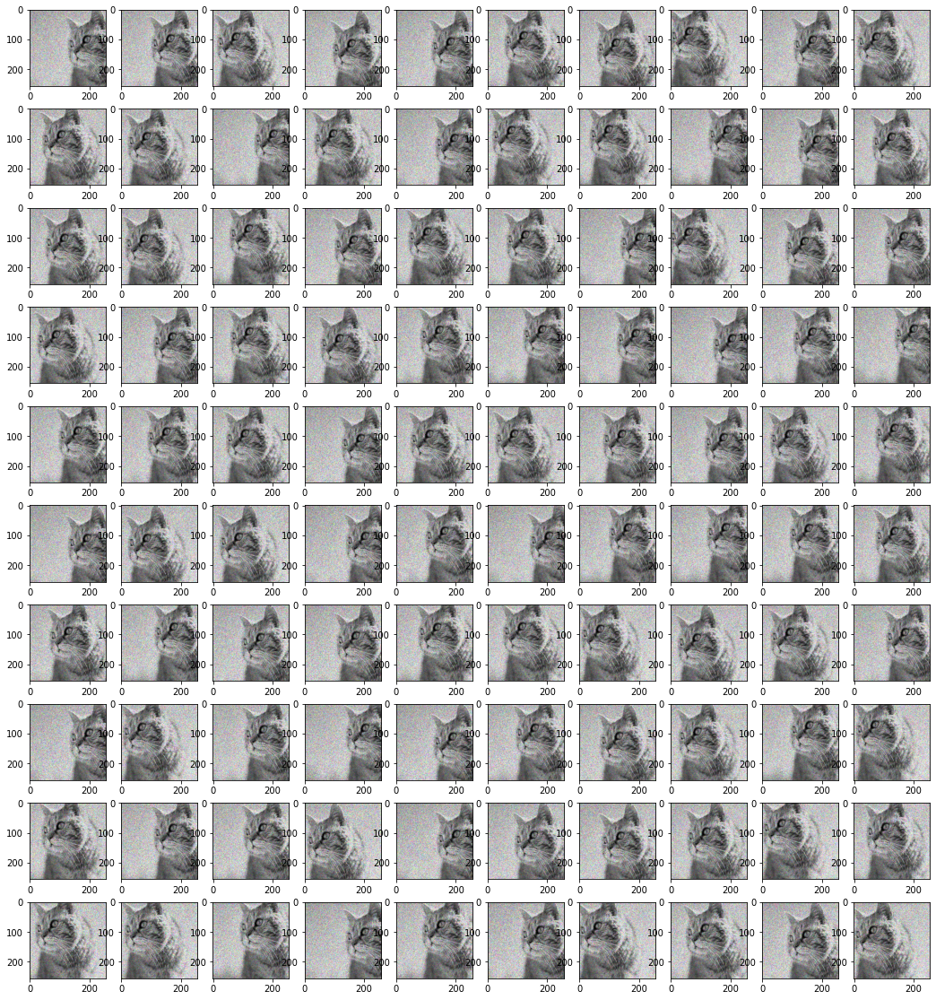

In [19]:
# Use various techniques and functions in albumentations library. show 100 images.
def transform_data(img_arr):
    transform = A.Compose(
        [A.ToGray(p=1),
         A.MultiplicativeNoise(multiplier=[0.5, 1.5], 
                               elementwise=True, per_channel=True, p=1),
         A.RandomCrop(width=256, height=256)]
    )
    t_image = transform(image=img_arr)
    t_image = t_image['image']
    return t_image

plt.figure(figsize=(18,20))
for i in range(100):
    image = transform_data(image_arr)
    plt.subplot(10,10,i+1)
    plt.imshow(image)


### 더 나아간 기법들

지금까지 우리가 보아왔던 방식은 딥러닝이 아닌 일정한 수학적 알고리즘을 적용한 augmentation들이다. 하지만 딥러닝이 발전함에 따라 data augmentation에도 딥러닝을 활용하는 방식이 개발되고 있다.

대표적으로 GAN을 Data augmentation에 활용할 수 잇다. 쉬운 예로는 전통적인 색상 변환 대신 스타일 트랜스퍼(style transfer) 모델을 적용해 볼 수 있다.

아래 논문은 전통적은 augmentation 방법과 GAN을 활용한 augmentation을 적용하여 효과를 실험했다. 자세한 내용은 논문을 참고해라.

http://cs231n.stanford.edu/reports/2017/pdfs/300.pdf

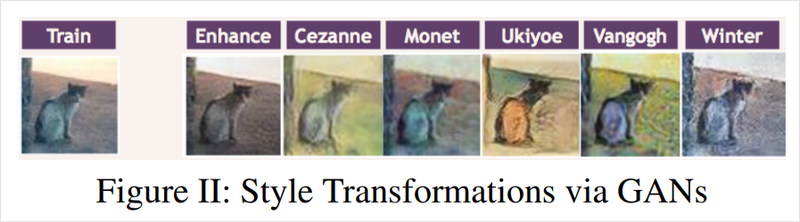